In [1]:
import typing as T  # pylint: disable=unused-import

import numpy as np
import numpy.typing as npt

from pydrake.geometry.optimization import (  # pylint: disable=import-error, no-name-in-module
    HPolyhedron,
    Point,
    ConvexSet,
    Hyperrectangle,
    VPolytope,
    Hyperellipsoid,
    LoadIrisRegionsYamlFile,
)



from pydrake.symbolic import ( # pylint: disable=import-error, no-name-in-module, unused-import
    Polynomial,
    Variable,
    Variables,
    Expression,
)  

from pydrake.solvers import (  # pylint: disable=import-error, no-name-in-module, unused-import
    MathematicalProgram,
    MathematicalProgramResult,
    Solve,
    MosekSolver,
    MosekSolverDetails,
    SolverOptions,
    CommonSolverOption,
    IpoptSolver,
    SnoptSolver,
    GurobiSolver,
    OsqpSolver,
    ClarabelSolver,
)


from shortest_walk_through_gcs.util import (
    timeit,
    diditwork,
    INFO,
    YAY,
    WARN,
    ERROR,
    concatenate_polyhedra,
)  # pylint: disable=import-error, no-name-in-module, unused-import

import plotly.graph_objects as go  # pylint: disable=import-error
from plotly.express.colors import sample_colorscale  # pylint: disable=import-error
import plotly.graph_objs as go
from plotly.subplots import make_subplots

from shortest_walk_through_gcs.gcs_dual import DualEdge, DualVertex, PolynomialDualGCS
from shortest_walk_through_gcs.program_options import FREE_POLY, PSD_POLY, CONVEX_POLY, ProgramOptions

import plotly
import plotly.graph_objs as go
from IPython.display import display, HTML

plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))

from shortest_walk_through_gcs.incremental_search import obtain_rollout, RestrictionSolution, precompute_k_step_feasible_paths_from_every_vertex


np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

from testing_zmp_helpers import animate_footstep_plan, check_that_foot_forces_exist

In [41]:
# system parameters

# foot size
w = 0.05 # m
h = 0.10 # m

# footsteps how far away
W = 0.8
H = 0.8

# body properties
g = 9.81 # m/s^2
m = 80 # kg
z = 0.9 # m
mu = 0.5 # coef of friction

# time discretization
dt = 0.2 # s

# environment  dimensions
Lx = 4 # m
Ly = 4 # m both for feet location and for CoM location

v_max = 2.5 # m/s

step_length = 0.4

dx_com_foot = 0.15
dy_com_foot = 0.20

In [42]:
options = ProgramOptions()
options.potential_polynomial_degree = 2
options.potential_type = PSD_POLY

options.solve_shortest_walk_not_path = True
options.s_procedure_multiplier_degree_for_linear_inequalities = 0 # TODO change me
options.s_procedure_take_product_of_linear_constraints = True # TODO change me

options.cost_to_go_synthesis_use_robust_mosek_parameters = True
options.cost_to_go_synthesis_MSK_DPAR_INTPNT_CO_TOL_REL_GAP = 1e-9
options.cost_to_go_synthesis_MSK_DPAR_INTPNT_CO_TOL_PFEAS = 1e-9
options.cost_to_go_synthesis_MSK_DPAR_INTPNT_CO_TOL_DFEAS = 1e-9

options.right_edge_point_must_be_inside_intersection_of_left_and_right_sets = False

options.potentials_are_not_a_function_of_target_state = True

In [43]:
control_cost = 0.01
time_cost = 1
foot_movement_cost = 0.01
foot_movement_cost_surrogate = 0.01
# terminal_cost = np.diag([1,1, 0.1,0.1, 0.5,0.5,0.5,0.5])
terminal_cost = np.diag([1,1, 0.1,0.1, 0.001,0.001,0.001,0.001])
terminal_cost_surrogate = np.diag([1,1, 0.1,0.1, 0.5,0.5,0.5,0.5])
foot_down_cost = 0

def cost_function(xl,u,xr,xt,dt=dt):
    cost_expr = control_cost * u.dot(u) # control cost
    cost_expr += time_cost # time cost
    cost_expr += foot_movement_cost * (xr[4:6]-xl[4:6]).dot(xr[4:6]-xl[4:6]) # left foot movement cost
    cost_expr += foot_movement_cost * (xr[6:8]-xl[6:8]).dot(xr[6:8]-xl[6:8]) # left foot movement cost
    cost_expr += (xl-xt).dot(terminal_cost).dot(xl-xt) # terminal cost
    return cost_expr * dt

def cost_function_surrogate(xl,u,xr,xt,dt=dt):
    cost_expr = control_cost * u.dot(u) # control cost
    cost_expr += time_cost # time cost
    cost_expr += foot_movement_cost_surrogate * (xr[4:6]-xl[4:6]).dot(xr[4:6]-xl[4:6]) # left foot movement cost
    cost_expr += foot_movement_cost_surrogate * (xr[6:8]-xl[6:8]).dot(xr[6:8]-xl[6:8]) # left foot movement cost
    cost_expr += (xl-xt).dot(terminal_cost_surrogate).dot(xl-xt) # terminal cost
    return cost_expr * dt


cost_function_footstep_down = cost_function
cost_function_footstep_down_surrogate = cost_function_surrogate


In [44]:
options.relax_target_condition_during_rollout = False
target_point = np.array([0,0,0,0, -0.15,0, 0.15,0])
target_bounds = np.array([0.02,0.02, 0.0075,0.0075, 0.005,0.005,0.005,0.005])
target_set = Hyperrectangle(target_point - target_bounds, target_point + target_bounds)
graph = PolynomialDualGCS(options, target_set)



# options.relax_target_condition_during_rollout = True
# target_set = Point(np.array([0,0,0,0, -0.25,0,0.25,0]))
# target_bounds = np.array([0.02,0.02, 0.0075,0.0075, 0.02,0.02,0.02,0.02])
# relaxed_target_condition_for_policy = Hyperrectangle(-target_bounds, target_bounds)
# graph = PolynomialDualGCS(options, target_set, relaxed_target_condition_for_policy=relaxed_target_condition_for_policy)

position_polyhedron = Hyperrectangle([-Lx, -Ly], [Lx, Ly])
velocity_polyhedron = Hyperrectangle([-v_max, -v_max], [v_max, v_max])
left_right_foot_polyhedron_top    = HPolyhedron([[1,0,-1,0], # left halfplane
                                                 [0,-1,0,1], # top hyperplane
                                                 [-1,0,1,0], # right hyperplane
                                                 [0,1,0,-1], # bottom hyperplane
                                                 [h,w,-h,-w]], # diagonal
                                                 [-2*w, H, W, 0, -4.5*h*w])
                                                #  [0, H, W, 0, -4*h*w])
left_right_foot_polyhedron_top = left_right_foot_polyhedron_top.Intersection(
    concatenate_polyhedra([position_polyhedron, position_polyhedron])
    )

left_right_foot_polyhedron_bottom = HPolyhedron([[1,0,-1,0], # left halfplane
                                                 [0,1,0,-1], # bottom hyperplane
                                                 [-1,0,1,0], # right hyperplane
                                                 [0,-1,0,1], # top hyperplane
                                                 [h,-w,-h,w]], # diagonal
                                                 [-2*w, H, W, 0, -4.5*h*w])
                                                #  [0, H, W, 0, -4*h*w])
left_right_foot_polyhedron_bottom = left_right_foot_polyhedron_bottom.Intersection(
    concatenate_polyhedra([position_polyhedron, position_polyhedron])
    )

bottom_set_full = concatenate_polyhedra([position_polyhedron, velocity_polyhedron, left_right_foot_polyhedron_bottom])
top_set_full = concatenate_polyhedra([position_polyhedron, velocity_polyhedron, left_right_foot_polyhedron_top])

In [45]:
# adding vertices

v_target = graph.vertices["target"]

Ld_Rd_2 = graph.AddVertex("Ld_Rd_2", top_set_full)
Ld_Rd_1 = graph.AddVertex("Ld_Rd_1", bottom_set_full)

Ld_Ru_2 = graph.AddVertex("Ld_Ru_2", top_set_full)
Ld_Ru_1 = graph.AddVertex("Ld_Ru_1", bottom_set_full)

Lu_Rd_2 = graph.AddVertex("Lu_Rd_2", top_set_full)
Lu_Rd_1 = graph.AddVertex("Lu_Rd_1", bottom_set_full)

# add self-edges
for v in graph.vertices.values():
    if v.name not in ("target", "source1", "source2"):
        graph.AddEdge(v,v, cost_function, cost_function_surrogate)

# moving the right leg
graph.AddEdge(Ld_Ru_2, Ld_Ru_1, cost_function, cost_function_surrogate)
graph.AddEdge(Ld_Ru_1, Ld_Ru_2, cost_function, cost_function_surrogate)

# moving the left leg
graph.AddEdge(Lu_Rd_2, Lu_Rd_1, cost_function, cost_function_surrogate)
graph.AddEdge(Lu_Rd_1, Lu_Rd_2, cost_function, cost_function_surrogate)

# planting the right leg
graph.AddEdge(Ld_Ru_2, Ld_Rd_2, cost_function_footstep_down, cost_function_footstep_down_surrogate)
graph.AddEdge(Ld_Ru_1, Ld_Rd_1, cost_function_footstep_down, cost_function_footstep_down_surrogate)

# lifting the right leg
graph.AddEdge(Ld_Rd_2, Ld_Ru_2, cost_function, cost_function_surrogate)
graph.AddEdge(Ld_Rd_1, Ld_Ru_1, cost_function, cost_function_surrogate)

# planting the left leg
graph.AddEdge(Lu_Rd_2, Ld_Rd_2, cost_function_footstep_down, cost_function_footstep_down_surrogate)
graph.AddEdge(Lu_Rd_1, Ld_Rd_1, cost_function_footstep_down, cost_function_footstep_down_surrogate)

# lifting the left leg
graph.AddEdge(Ld_Rd_2, Lu_Rd_2, cost_function, cost_function_surrogate)
graph.AddEdge(Ld_Rd_1, Lu_Rd_1, cost_function, cost_function_surrogate)



# --------------------------------------------------
# to target

# legs already down
graph.AddEdge(Ld_Rd_2, v_target, cost_function, cost_function_surrogate)
graph.AddEdge(Ld_Rd_1, v_target, cost_function, cost_function_surrogate)

# planting the leg in the last step
graph.AddEdge(Ld_Ru_2, v_target, cost_function_footstep_down, cost_function_footstep_down_surrogate)
graph.AddEdge(Ld_Ru_1, v_target, cost_function_footstep_down, cost_function_footstep_down_surrogate)
graph.AddEdge(Lu_Rd_2, v_target, cost_function_footstep_down, cost_function_footstep_down_surrogate)
graph.AddEdge(Lu_Rd_1, v_target, cost_function_footstep_down, cost_function_footstep_down_surrogate)


# TODO: edges from start? 
# can i add more constraints on the start
# or just push up on down and down sets.


In [46]:
# adding com dynamics edge constraints

for edge in graph.edges.values():
    edge.u = graph.prog.NewIndeterminates(2, "a_" + edge.name)
    edge.quadratic_inequality_evaluators.append( lambda xl,u,xr,xt: mu*m*g - u[0:2].dot(u[0:2]) )

    # -------------------------------------------------------------------------------------------
    # com dynamics
    edge.groebner_basis_substitutions[edge.right.x[0]] = edge.left.x[0] + dt*edge.left.x[2] + edge.u[0] * dt**2 /2
    edge.groebner_basis_substitutions[edge.right.x[1]] = edge.left.x[1] + dt*edge.left.x[3] + edge.u[1] * dt**2 /2
    edge.groebner_basis_substitutions[edge.right.x[2]] = edge.left.x[2] + dt*edge.u[0]
    edge.groebner_basis_substitutions[edge.right.x[3]] = edge.left.x[3] + dt*edge.u[1]
    def groebner_evaluator1(xl,u,xr,xt, dt=dt):
        return xr[0:2] - (xl[0:2] + xl[2:4]*dt + u[0:2]*dt**2/2)
    def groebner_evaluator2(xl,u,xr,xt, dt=dt):
        return xr[2:4] - (xl[2:4] + u[0:2]*dt)
    edge.groebner_basis_equality_evaluators = [groebner_evaluator1, groebner_evaluator2]

In [ ]:
# adding convex hull edge constraints
def in_chull_of_position(p, l):
    return [
        p[0] - l[0] + w, 
        p[1] - l[1] + h, 
        l[0] - p[0] + w,
        l[1] - p[1] + h
    ]

def in_chull_of_lr_top2_linear(p, l, r):
    return [
        r[1] - p[1] + h,
        r[0] - p[0] + w,
        p[1] - l[1] + h,
        p[0] - l[0] + w,
    ]
def in_chull_of_lr_top2_quadratic(p, l, r):
    return [
        np.array([r[1]-l[1], -r[0]+l[0]]).dot( np.array([w,-h]) + (l+r)/2 - p ),
        np.array([-r[1]+l[1], r[0]-l[0]]).dot( np.array([-w,h]) + (l+r)/2 - p )
    ]

def in_chull_of_lr_bottom1_linear(p, l, r):
    return [
        p[1] - r[1] + h,
        r[0] - p[0] + w,
        l[1] - p[1] + h,
        p[0] - l[0] + w,
    ]
def in_chull_of_lr_bottom1_quadratic(p, l, r):
    return [
        np.array([r[1]-l[1], -r[0]+l[0]]).dot( np.array([-w,-h]) + (l+r)/2 - p ),
        np.array([-r[1]+l[1], r[0]-l[0]]).dot( np.array([w,h]) + (l+r)/2 - p )
    ]


# here: add 
num_repeats = 3

def current_cop(xl,u,xr):
    return xl[0:2] - (z/g)* u[0:2]

def current_in_chull_of_left_foot(xl,u,xr,xt):
    return in_chull_of_position(current_cop(xl,u,xr), xl[4:6])

def current_in_chull_of_right_foot(xl,u,xr,xt):
    return in_chull_of_position(current_cop(xl,u,xr), xl[6:8])

def current_in_chull_left_right_top2_linear(xl,u,xr,xt):
    return in_chull_of_lr_top2_linear(current_cop(xl,u,xr), xl[4:6], xl[6:8])
def current_in_chull_left_right_top2_quadratic(xl,u,xr,xt):
    return in_chull_of_lr_top2_quadratic(current_cop(xl,u,xr), xl[4:6], xl[6:8])

def current_in_chull_left_right_bottom1_linear(xl,u,xr,xt):
    return in_chull_of_lr_bottom1_linear(current_cop(xl,u,xr), xl[4:6], xl[6:8])
def current_in_chull_left_right_bottom1_quadratic(xl,u,xr,xt):
    return in_chull_of_lr_bottom1_quadratic(current_cop(xl,u,xr), xl[4:6], xl[6:8])

for edge in graph.edges.values():
    xl, u, xr, xt = edge.left.x, edge.u, edge.right.x, None
    # CURRENT
    # both legs down, top
    if edge.left.name in ("Ld_Rd_1", "source1"):
        edge.linear_inequality_evaluators.append(current_in_chull_left_right_bottom1_linear)
        edge.quadratic_inequality_evaluators.append(current_in_chull_left_right_bottom1_quadratic)
    elif edge.left.name in ("Ld_Rd_2", "source2"):
        edge.linear_inequality_evaluators.append(current_in_chull_left_right_top2_linear)
        edge.quadratic_inequality_evaluators.append(current_in_chull_left_right_top2_quadratic)

    elif edge.left.name in ("Ld_Ru_1", "Ld_Ru_2"):
        edge.linear_inequality_evaluators.append(current_in_chull_of_left_foot)
    elif edge.left.name in ("Lu_Rd_1", "Lu_Rd_2"):
        edge.linear_inequality_evaluators.append(current_in_chull_of_right_foot)
    else:
        raise Exception("bad edge case for current")

In [48]:
for edge in graph.edges.values():
    xl, u, xr, xt = edge.left.x, edge.u, edge.right.x, None
    if edge.left.name in ("Ld_Rd_1", "Ld_Rd_2", "Ld_Ru_1", "Ld_Ru_2", "source1", "source2"):
        # left foot stays still, green
        edge.groebner_basis_substitutions[edge.right.x[4]] = edge.left.x[4]
        edge.groebner_basis_substitutions[edge.right.x[5]] = edge.left.x[5]
        edge.groebner_basis_equality_evaluators.append(lambda xl,u,xr,xt: xl[4:6]-xr[4:6])
        
    if edge.left.name in ("Ld_Rd_1", "Ld_Rd_2", "Lu_Rd_1", "Lu_Rd_2", "source1", "source2"):
        # right foot stays still, pink
        edge.groebner_basis_substitutions[edge.right.x[6]] = edge.left.x[6]
        edge.groebner_basis_substitutions[edge.right.x[7]] = edge.left.x[7]
        edge.groebner_basis_equality_evaluators.append(lambda xl,u,xr,xt: xl[6:8]-xr[6:8])

    if edge.left.name in ("Lu_Rd_1", "Lu_Rd_2"):
        # left foot not further than, light green
        edge.linear_inequality_evaluators.append( lambda xl,u,xr,xt: xl[4:6]-xr[4:6]+step_length )
        edge.linear_inequality_evaluators.append( lambda xl,u,xr,xt: xr[4:6]-xl[4:6]+step_length )

    if edge.left.name in ("Ld_Ru_1", "Ld_Ru_2"):
        # right foot not further than, purple
        edge.linear_inequality_evaluators.append( lambda xl,u,xr,xt: xl[6:8]-xr[6:8]+step_length )
        edge.linear_inequality_evaluators.append( lambda xl,u,xr,xt: xr[6:8]-xl[6:8]+step_length )



In [49]:
# can and should do better
graph.MaxCostOverVertex(Ld_Rd_1)
graph.MaxCostOverVertex(Ld_Rd_2)

graph.SolvePolicy()
graph.options.policy_solver = None
precompute_k_step_feasible_paths_from_every_vertex(graph, [2,3])

pushing up


100%|██████████| 2/2 [00:00<00:00, 488.65it/s]


adding edge polynomial constraints


100%|██████████| 24/24 [00:06<00:00,  3.69it/s]


Solve took 0.688s
solve successful!
-330.6501767009904
SolutionResult.kSolutionFound
Solver is Mosek
solve time 0.6251029968261719
rescode 0
solution_status 1
Set parameter Username

--------------------------------------------
--------------------------------------------

Academic license - for non-commercial use only - expires 2024-12-01


In [50]:
graph.store_cost_to_go_functions("ZMP_quadratic")
# graph.load_cost_to_go_functions("ZMP_quadratic")


In [12]:
len(graph.edges)

24

# Nick's descktop: 400 ms solve time

In [52]:
graph.options.policy_solver = SnoptSolver

graph.options.use_parallelized_solve_time_reporting = True

graph.options.policy_optimize_path_so_far_and_K_step = True

graph.options.use_greedy_with_backtracking_policy=True
graph.options.use_a_star_with_limited_backtracking_policy=False

graph.options.max_num_shortcut_steps = 1 # do multiple rounds instead

graph.options.postprocess_via_shortcutting = True
graph.options.postprocess_by_solving_restriction_on_mode_sequence = False

graph.options.verbose_restriction_improvement=True


graph.options.postprocess_shortcutting_long_sequences = True
graph.options.long_sequence_num = 3

graph.options.a_star_backtracking_limit = 10
graph.options.iteration_termination_limit = 120


graph.options.subpath_expansion_limit = 5

graph.options.do_not_return_to_previously_visited_vertices = False

graph.options.policy_verbose_choices = False

graph.options.num_simulated_cores_for_parallelized_solve_time_reporting = 16


graph.options.policy_snopt_minor_iterations_limit = 50
graph.options.policy_snopt_major_iterations_limit = 100
graph.options.policy_snopt_minor_feasibility_tolerance = 1e-4
graph.options.policy_snopt_major_feasibility_tolerance = 1e-4
graph.options.policy_snopt_major_optimality_tolerance = 1e-4
# NOTE: reducing solver tolerance does yeild better solve times, 
# but sometimes slightly worse trajectories (slightly more steps). 
# always check against 1e-6.

graph.options.policy_use_warmstarting=True

graph.options.so_far_and_k_step_initials = 5
graph.options.so_far_and_k_step_ratio = 2 # reoptimize full thing every other time

# diagonal stepping

In [53]:
def get_standing_at_xy(p,v):
    return np.array([p[0], p[1], v[0], v[1], p[0]-0.15, p[1], p[0]+0.15, p[1]])

state = get_standing_at_xy([-1.5, -1.5], [0,0]) # 0.73s on my machine # 160ms on Nick's
restriction, solve_time = obtain_rollout(graph, 2, Ld_Rd_1, state)
if restriction is not None:
    YAY(restriction.vertex_names())
    YAY(solve_time)
else:
    ERROR("failed to solve")
check_that_foot_forces_exist(restriction,z,m,g,w,h,mu)

using long sequence shortcut posptprocessing
using shortcut posptprocessing
shortcut posptprocessing, num_parallel_solves 1.0
[0.004 0.002 0.019 0.002 0.017 0.002 0.002 0.003]
shortcut posptprocessing time 0.042194542
path cost improved from 9.42 to 8.27 ; original is 13.8 % worse
['Ld_Rd_1' 'Ld_Ru_1' 'Ld_Ru_2' 'Ld_Rd_2' 'Lu_Rd_2' 'Lu_Rd_2' 'Lu_Rd_1'
 'Ld_Rd_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Rd_1' 'Lu_Rd_1' 'Ld_Rd_1' 'Ld_Ru_1'
 'Ld_Rd_1' 'Lu_Rd_1' 'target']
0.28873366600000006
forces are good


In [54]:
# animate_footstep_plan(w,h,dt,restriction,z,g, ylim=[-0.5,0.5], xlim=[-2.25,0.25], scale_time=3, num_interpolation_points=10, bbox_to_anchor=(-0.05,-0.1,0,0),)
# animate_footstep_plan(w,h,dt,restriction,z,g, ylim=[-2.25,0.25], xlim=[-0.5,0.5], scale_time=3, num_interpolation_points=10, bbox_to_anchor=(-1.15,-0.1,0,0))
animate_footstep_plan(w,h,dt,restriction,z,g, ylim=[-1.75,0.25], xlim=[-1.75,0.25], scale_time=3, num_interpolation_points=10, bbox_to_anchor=(-0.2,-0.1,0,0))

# lateral stepping

In [57]:
def get_standing_at_xy(p,v):
    return np.array([p[0], p[1], v[0], v[1], p[0]-0.15, p[1], p[0]+0.15, p[1]])

state = get_standing_at_xy([-1.5, 0], [0,0]) # 1.3s on my machine, 300ms on Nick's
# state = get_standing_at_xy([0, -2], [0,0]) # 0.49s on my machine # 120ms on Nick's
# state = get_standing_at_xy([-1.5, -1.5], [0,0]) # 0.73s on my machine # 160ms on Nick's
restriction, solve_time = obtain_rollout(graph, 2, Ld_Rd_1, state)
if restriction is not None:
    YAY(restriction.vertex_names())
    YAY(solve_time)
else:
    ERROR("failed to solve")
check_that_foot_forces_exist(restriction,z,m,g,w,h,mu)

using long sequence shortcut posptprocessing
using shortcut posptprocessing
shortcut posptprocessing, num_parallel_solves 1.0
[0.003 0.001 0.001 0.001 0.001 0.001 0.001 0.001]
shortcut posptprocessing time 0.033653708000000004
path cost improved from 6.66 to 5.42 ; original is 22.9 % worse
['Ld_Rd_1' 'Ld_Ru_1' 'Ld_Rd_1' 'Lu_Rd_1' 'Ld_Rd_1' 'Ld_Ru_1' 'Ld_Rd_1'
 'Lu_Rd_1' 'Lu_Rd_1' 'Ld_Rd_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Rd_1' 'Lu_Rd_1'
 'Lu_Rd_1' 'target']
0.301330835
forces are good


In [58]:
animate_footstep_plan(w,h,dt,restriction,z,g, ylim=[-0.5,0.5], xlim=[-2.25,0.25], scale_time=3, num_interpolation_points=10, bbox_to_anchor=(-0.05,-0.1,0,0),)

# forward stepping

In [13]:
def get_standing_at_xy(p,v):
    return np.array([p[0], p[1], v[0], v[1], p[0]-0.15, p[1], p[0]+0.15, p[1]])

# state = get_standing_at_xy([-2, 0], [0,0]) # 1.3s on my machine, 300ms on Nick's
state = get_standing_at_xy([0, -2], [0,0]) # 0.49s on my machine # 120ms on Nick's
# state = get_standing_at_xy([-1.5, -1.5], [0,0]) # 0.73s on my machine # 160ms on Nick's
restriction, solve_time = obtain_rollout(graph, 2, Ld_Rd_1, state)
if restriction is not None:
    YAY(restriction.vertex_names())
    YAY(solve_time)
else:
    ERROR("failed to solve")
check_that_foot_forces_exist(restriction,z,m,g,w,h,mu)

using long sequence shortcut posptprocessing
using shortcut posptprocessing
shortcut posptprocessing, num_parallel_solves 1.0
[0.020 0.002 0.004 0.002 0.004 0.003 0.008 0.004]
shortcut posptprocessing time 0.019918291
path cost improved from 8.16 to 8.16 ; original is 0.0 % worse
['Ld_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Ld_Rd_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_2'
 'Ld_Rd_2' 'Lu_Rd_2' 'Lu_Rd_2' 'Lu_Rd_1' 'Ld_Rd_1' 'Ld_Ru_1' 'Ld_Rd_1'
 'Lu_Rd_1' 'Ld_Rd_1' 'Ld_Ru_1' 'target']
0.5563987909999999
forces are good


In [14]:
animate_footstep_plan(w,h,dt,restriction,z,g, ylim=[-2.25,0.25], xlim=[-0.5,0.5], scale_time=3, num_interpolation_points=10, bbox_to_anchor=(-1.15,-0.1,0,0))

In [39]:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML, display
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from matplotlib.patches import Rectangle, Arrow, FancyArrow


from testing_zmp_helpers import plot_rectangle


class TempData:
    def __init__(self, restriction: RestrictionSolution, dt:float, z, g) -> None:
        restriction.trajectory = np.array(restriction.trajectory)
        restriction.edge_variable_trajectory = np.array(restriction.edge_variable_trajectory)
        self.com_positions = np.array(restriction.trajectory[:, 0:2])
        self.com_velocities = np.array(restriction.trajectory[:, 2:4])
        self.accelerations = np.array(restriction.edge_variable_trajectory[:, 0:2])
        def current_cop_temp(xl,u,z,g):
            return xl[0:2] - (z/g)* u[0:2]
        self.cop_positions = [
            current_cop_temp(restriction.trajectory[i], restriction.edge_variable_trajectory[i], z,g) for i in range(restriction.length()-1)
            ]
        # self.cop_positions.append(next_cop(None, restriction.edge_variable_trajectory[-1], restriction.trajectory[-1]))
        self.cop_positions.append(self.com_positions[-1])
        self.cop_positions = np.array(self.cop_positions)
        self.left_foot_positions = np.array(restriction.trajectory[:, 4:6])
        self.right_foot_positions = np.array(restriction.trajectory[:, 6:8])
        self.vertex_path = np.array(restriction.vertex_names())
        self.dt = dt
        self.time_traj = np.array(list(range(0, len(self.right_foot_positions)))) * dt

    def interpolate(self, num_points:int):
        if num_points > 2:
            small_time_traj = np.hstack([np.linspace(self.time_traj[i], self.time_traj[i+1], num_points)[:-1] for i in range(len(self.time_traj)-1)] + [self.time_traj[-1]])
            small_pos_traj = np.zeros((len(small_time_traj), 2))
            small_vel_traj = np.zeros((len(small_time_traj), 2))
            small_acc_traj = np.zeros((len(small_time_traj)-1, 2))
            small_cop_traj = np.zeros((len(small_time_traj), 2))

            small_left_positions = np.zeros((len(small_time_traj), 2))
            small_right_positions = np.zeros((len(small_time_traj), 2))

            for i in range(len(self.time_traj)-1):
                for j in range(num_points-1):
                    small_acc_traj[i*(num_points-1) + j] = self.accelerations[i]

            small_pos_traj[0] = self.com_positions[0]
            small_vel_traj[0] = self.com_velocities[0]
            small_vertex_path = []

            for i in range(len(small_pos_traj)-1):
                small_delta_t = small_time_traj[i+1] - small_time_traj[i]
                small_pos_traj[i+1] = small_pos_traj[i] + small_vel_traj[i] * small_delta_t +  small_acc_traj[i] * small_delta_t ** 2 / 2
                small_vel_traj[i+1] = small_vel_traj[i] + small_acc_traj[i] * small_delta_t

                small_vertex_path.append(self.vertex_path[i//(num_points-1)])

                small_cop_traj[i] = small_pos_traj[i] - (z/g) * small_acc_traj[i]
                # small_cop_traj[i] = self.cop_positions[i//(num_points-1)]
                c1 = (num_points -1 - i % (num_points-1))/(num_points-1)
                c2 = 1-c1
                small_left_positions[i] = self.left_foot_positions[i // (num_points-1)] * c1 + self.left_foot_positions[i // (num_points-1)+1] * c2
                small_right_positions[i] = self.right_foot_positions[i // (num_points-1)] * c1 + self.right_foot_positions[i // (num_points-1)+1] * c2
                # small_cop_traj[i] =  self.cop_positions[i // (num_points-1)] * c1 + self.cop_positions[i // (num_points-1)+1] * c2


            small_cop_traj[-1] = self.cop_positions[-1]
            small_left_positions[-1] = self.left_foot_positions[-1]
            small_right_positions[-1] = self.right_foot_positions[-1]
            small_vertex_path.append(self.vertex_path[-1])
            small_vertex_path = np.array(small_vertex_path)

            assert np.allclose(self.com_positions[-1], small_pos_traj[-1], atol=1e-3)

            self.com_positions = small_pos_traj
            self.com_velocities = small_vel_traj
            self.accelerations = small_acc_traj
            self.cop_positions = small_cop_traj
            self.left_foot_positions = small_left_positions
            self.right_foot_positions = small_right_positions
            self.vertex_path = small_vertex_path
            self.dt = self.dt/num_points
            self.time_traj = small_time_traj

    def get_kth_mode_indices(self, k):
        current_index = 0
        for i in range(k):
            mode_now = self.vertex_path[current_index]
            current_index += 1
            if current_index >= len(self.vertex_path):
                return None, None
            while mode_now[:5] == self.vertex_path[current_index][:5]:
                current_index +=1
        start_index = current_index
        mode_now = self.vertex_path[current_index]
        while current_index < len(self.vertex_path) and mode_now[:5] == self.vertex_path[current_index][:5]:
            current_index +=1
        end_index = current_index
        return start_index, end_index



def overlay_colors(hex_a, hex_b, alpha):
    """
    Calculate the resulting color of overlaying color B with alpha on top of color A.

    Args:
        hex_a (str): Background color in hex format (e.g., "#RRGGBB").
        hex_b (str): Foreground color in hex format (e.g., "#RRGGBB").
        alpha (float): Alpha value of the foreground color, between 0 and 1.

    Returns:
        str: Resulting color in hex format (e.g., "#RRGGBB").
    """
    # Convert hex colors to RGB components
    def hex_to_rgb(hex_color):
        hex_color = hex_color.lstrip('#')
        return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

    def rgb_to_hex(rgb):
        return "#" + "".join(f"{c:02X}" for c in rgb)

    rgb_a = hex_to_rgb(hex_a)
    rgb_b = hex_to_rgb(hex_b)

    # Calculate the resulting color for each channel
    result_rgb = [
        int((1 - alpha) * a + alpha * b)
        for a, b in zip(rgb_a, rgb_b)
    ]

    # Convert resulting RGB to hex
    return rgb_to_hex(result_rgb)


# plot a bunch of regular rectangles

def animate_footstep_plan_images(
    width, # foot width
    height, # foot height
    dt, # timestep
    restriction: RestrictionSolution, 
    z, # height of body
    g, # gravitational constant
    xlim=[-1,1], # plotting limits
    ylim=[-1,1], 
    num_interpolation_points = 2, # 
    velocity_scale = 0.1,
):

    temp_data = TempData(restriction, dt, z, g)
    temp_data.interpolate(num_interpolation_points)

    mode_index = 0
    while True:
        ind_l, ind_r = temp_data.get_kth_mode_indices(mode_index)
        if ind_l is None:
            break
        ind_r += 1
        if ind_r - ind_l == 2:
            mode_index += 1
            continue
        # get shadows
        shadows = np.linspace(0.2, 1.0, ind_r-ind_l, endpoint=True)
        

        # initialize figure for animation
        fig, ax = plt.subplots()
        for ind in range(ind_l, ind_r):
            alpha = shadows[ind-ind_l]
            # plot CoM
            # ax.scatter(temp_data.com_positions[ind][0], temp_data.com_positions[ind][1], color=overlay_colors("#FFFFFF", "#000000", alpha), zorder=5)
            # plot CoP
            ax.scatter(temp_data.cop_positions[ind][0], temp_data.cop_positions[ind][1], color=overlay_colors("#FFFFFF", "#FF0000", alpha), zorder=6)

            # TODO: plot velocity?
            # initial step limits

            # left foot
            plot_rectangle(
                temp_data.left_foot_positions[ind],  # center
                width,  # width
                height,  # eight
                ax=ax,
                edgecolor=overlay_colors("#FFFFFF", "#0000FF", alpha),
                facecolor=overlay_colors("#FFFFFF", "#0000FF", alpha) if ind in (ind_l,ind_r-1) else "white",
                # facecolor=overlay_colors("#FFFFFF", "#0000FF", alpha),
                zorder=3,
            )
            plot_rectangle(
                temp_data.right_foot_positions[ind],  # center
                width,  # width
                height,  # eight
                ax=ax,
                edgecolor=overlay_colors("#FFFFFF", "#FFA500", alpha),
                facecolor=overlay_colors("#FFFFFF", "#FFA500", alpha) if ind in (ind_l,ind_r-1) else "white",
                # facecolor=overlay_colors("#FFFFFF", "#FFA500", alpha),
                zorder=3,
            )
        ax.scatter(restriction.trajectory[-1][0], restriction.trajectory[-1][1], marker="x", color="magenta", zorder=1)
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)
        fig.show()
        mode_index += 1

In [25]:
temp_data = TempData(restriction, dt, z, g)
temp_data.interpolate(3)
temp_data.vertex_path

array(['Ld_Rd_1', 'Ld_Rd_1', 'Ld_Ru_1', 'Ld_Ru_1', 'Ld_Rd_1', 'Ld_Rd_1',
       'Lu_Rd_1', 'Lu_Rd_1', 'Ld_Rd_1', 'Ld_Rd_1', 'Ld_Ru_1', 'Ld_Ru_1',
       'Ld_Rd_1', 'Ld_Rd_1', 'Lu_Rd_1', 'Lu_Rd_1', 'Lu_Rd_2', 'Lu_Rd_2',
       'Ld_Rd_2', 'Ld_Rd_2', 'Ld_Ru_2', 'Ld_Ru_2', 'Ld_Rd_2', 'Ld_Rd_2',
       'Lu_Rd_2', 'Lu_Rd_2', 'Ld_Rd_2', 'Ld_Rd_2', 'Ld_Ru_2', 'Ld_Ru_2',
       'Ld_Rd_2', 'Ld_Rd_2', 'Lu_Rd_2', 'Lu_Rd_2', 'Ld_Rd_2', 'Ld_Rd_2',
       'Ld_Ru_2', 'Ld_Ru_2', 'Ld_Ru_2', 'Ld_Ru_2', 'Ld_Rd_2', 'Ld_Rd_2',
       'Lu_Rd_2', 'Lu_Rd_2', 'target'], dtype='<U7')

In [20]:
print(temp_data.get_kth_mode_indices(0))
print(temp_data.get_kth_mode_indices(1))
print(temp_data.get_kth_mode_indices(2))
print(temp_data.get_kth_mode_indices(3))
print(temp_data.get_kth_mode_indices(4))

(0, 2)
(2, 4)
(4, 6)
(6, 8)
(8, 10)


/var/folders/cs/wsm1pbzn3j38htj46lqxff4m0000gn/T/ipykernel_8203/1774047875.py:204: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



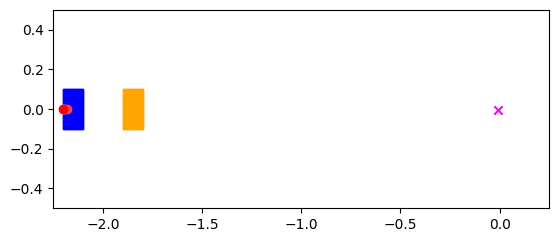

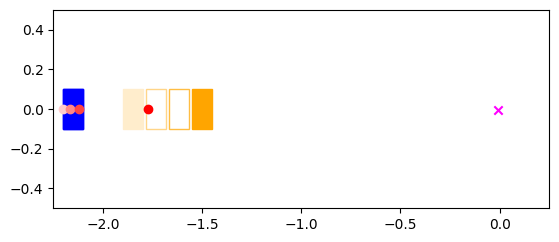

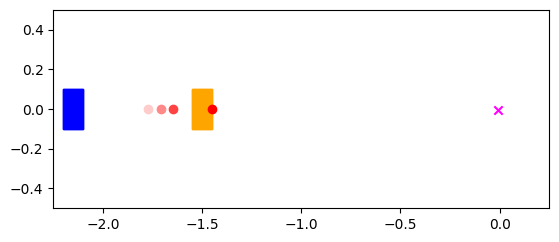

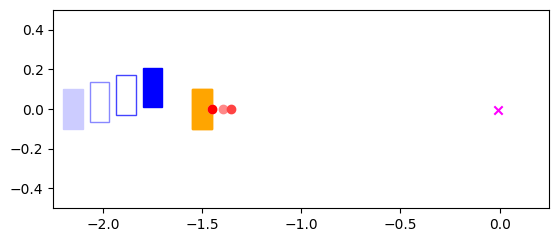

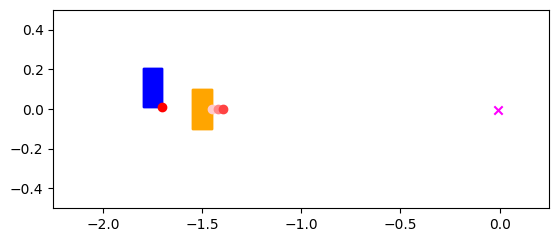

...

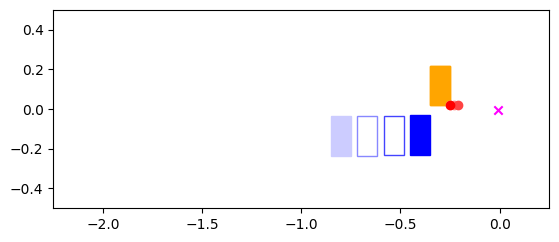

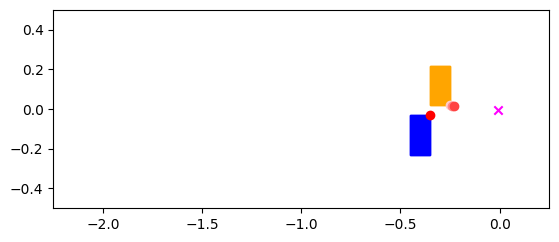

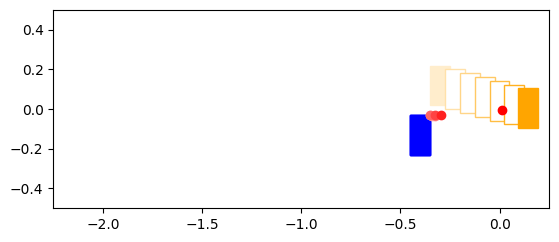

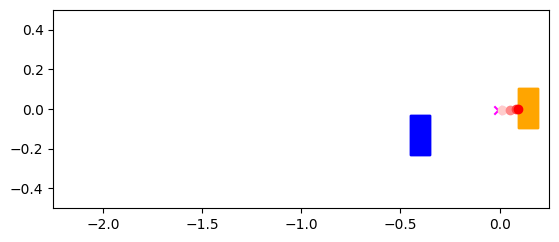

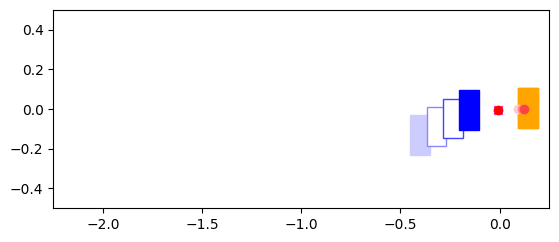

In [40]:
animate_footstep_plan_images(w,h,dt,restriction,z,g, ylim=[-0.5,0.5], xlim=[-2.25,0.25], num_interpolation_points=4)

In [23]:
animate_footstep_plan(w,h,dt,restriction,z,g, ylim=[-2.25,0.25], xlim=[-0.5,0.5], scale_time=3, num_interpolation_points=10, bbox_to_anchor=(-1.15,-0.1,0,0))

['Ld_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Ld_Rd_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_2'
 'Ld_Rd_2' 'Lu_Rd_2' 'Lu_Rd_2' 'Lu_Rd_1' 'Ld_Rd_1' 'Ld_Ru_1' 'Ld_Rd_1'
 'Lu_Rd_1' 'Ld_Rd_1' 'Ld_Ru_1' 'target']
['Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1'
 'Ld_Rd_1' 'Ld_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1'
 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1'
 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Lu_Rd_1' 'Ld_Rd_1'
 'Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1' 'Ld_Rd_1'
 'Ld_Rd_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1'
 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1'
 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_1' 'Ld_Ru_2' 'Ld_Ru_2'
 'Ld_Ru_2' 'Ld_Ru_2' 'Ld_Ru_2' 'Ld_Ru_2' 'Ld_Ru_2' 'Ld_Ru_2' 'Ld_Ru_2'
 'Ld_Rd_2' 'Ld_Rd_2' 'Ld_Rd_2' 'Ld_Rd_2' 'Ld_Rd_2' 'Ld_Rd_2' 'Ld_Rd_2'
 'Ld_Rd_2' 'Ld_Rd_2' 'Lu_Rd_2' 'Lu_Rd_2' 'Lu_Rd_2' 'Lu_Rd_2' 'Lu_Rd_2'
 'Lu_Rd_2' 'Lu_Rd_2' 'Lu_Rd_2' 'Lu_R